In [2]:
pip install img2vec_pytorch 


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip



  Using cached img2vec_pytorch-1.0.1-py3-none-any.whl.metadata (6.1 kB)
Using cached img2vec_pytorch-1.0.1-py3-none-any.whl (6.9 kB)


In [2]:
from PIL import Image
from img2vec_pytorch  import Img2Vec
import os


In [3]:
img2vec = Img2Vec(cuda=False) # cuda is set to false because i dont have a gpu

c:\Users\I7-4700\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\I7-4700\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [4]:
import re

In [5]:

features=[]
labels=[]

dir = r'D:\Projects\cv\dataset'  
image_files = os.listdir(dir)  # returns a list of filenames (without the directory path).
for img_name in image_files:
    img_path = os.path.join(dir, img_name)  # combine directory and file name
    img = Image.open(img_path)

   
    if img.mode != 'RGB':
        img = img.convert('RGB')

    img_feature = img2vec.get_vec(img)
    
    features.append(img_feature)
    label = re.sub(r'[^a-zA-Z]', '', img_name)  # remove numbers from the label , keeping them will hurt the accuracy of the model
    labels.append(label)

In [46]:
features

[array([2.89095461e-01, 5.94908595e-01, 7.23053992e-01, 1.13566542e+00,
        1.15792975e-01, 2.67528892e-01, 7.60045528e-01, 6.42810808e-03,
        8.70603144e-01, 3.62364352e-01, 3.14522884e-03, 3.82481213e-03,
        1.37745297e+00, 5.05720317e-01, 5.89559257e-01, 7.69515276e-01,
        5.10489166e-01, 1.08171493e-01, 5.18288240e-02, 1.88215643e-01,
        8.11028779e-01, 1.62724346e-01, 1.47780371e+00, 1.73339844e-01,
        1.87600040e+00, 8.09491873e-02, 0.00000000e+00, 0.00000000e+00,
        5.84779799e-01, 3.10753763e-01, 2.86342930e-02, 3.15771013e-01,
        1.75116992e+00, 1.70686364e-01, 0.00000000e+00, 3.13183874e-01,
        1.96371004e-01, 7.56584942e-01, 3.15097999e-03, 2.05146288e-03,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.18155502e-01,
        7.59868324e-01, 1.13033473e-01, 0.00000000e+00, 2.33434117e-03,
        1.35592759e-01, 7.19352007e-01, 0.00000000e+00, 1.02260458e+00,
        2.23257616e-01, 3.14292312e-01, 3.99360943e+00, 1.959064

In [48]:
#Save the features in an external file 
import csv

csv_file = 'image_features.csv'
with open(csv_file, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Feature', 'Label'])  #Header
    for feature, label in zip(features, labels):
        writer.writerow([feature.tolist(), label])  


In [6]:
import pickle
#A Python pickle file serializes a tuple of two numpy arrays, (feature, label). which makes it perfect for this case 
pickle_file = 'image_features.pkl'

with open(pickle_file, 'wb') as file:
    pickle.dump((features, labels), file)


In [35]:
print(f"Number of features: {len(features)}")
print(f"Number of labels: {len(labels)}")


Number of features: 1125
Number of labels: 1125


In [7]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)



In [37]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier()
clf.fit(X_train, y_train)


RandomForestClassifier()

In [40]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

   cloudyjpg       0.95      0.94      0.94        63
     rainjpg       0.96      1.00      0.98        49
    shinejpg       0.94      0.96      0.95        47
  sunrisejpg       0.98      0.95      0.97        66

    accuracy                           0.96       225
   macro avg       0.96      0.96      0.96       225
weighted avg       0.96      0.96      0.96       225



In [39]:
from sklearn.metrics import accuracy_score
y_pred = clf.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")


Accuracy: 0.96


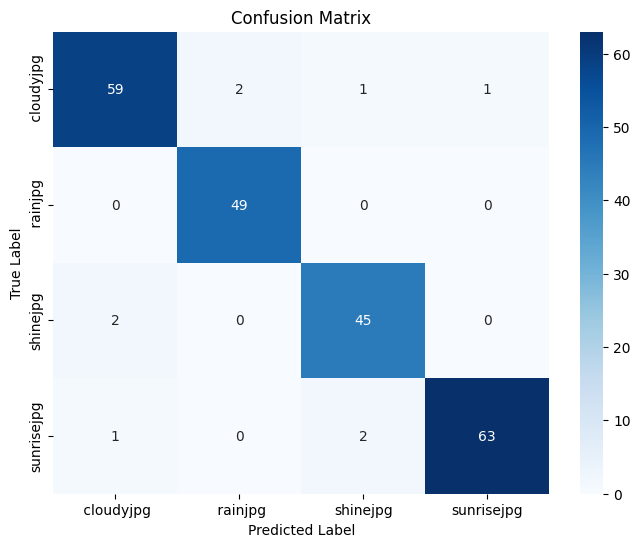

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

class_names = [' cloudyjpg', ' rainjpg', 'shinejpg', 'sunrisejpg']  


plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


from the confusion matrix we can see that :
59 cloudy prictures were correctly classified as cloudy , and 2 incorrectly as shiny and 1 as sunrise 
49 rainy were correctly classified as rainy , and 2 were incorrectly classified as cloudy 
45 shiny were correctly classified as shiny , and 2 were incorrectly classified as sunrise and 1 as cloudy 
45 sunrise were correctly classified as sunrise , and 1 was incorrectly classified as cloudy 


In [54]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(clf, features, labels, cv=5)
print(f"Cross-Validation Accuracy: {np.mean(scores)}")


c:\Users\I7-4700\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Cross-Validation Accuracy: 0.9511111111111112


In [55]:
# I'll save the model as a pkl file since it's an efficient way to store the trained model in a serialized format 
# I will use the joblib module instead of pickle beacause it's more efficient when it comes to rained models
import joblib

joblib.dump(clf, 'random_forest_model.pkl')



['random_forest_model.pkl']

***********************************************************************************************************************

Now we will test the model using an image that the model haven't seen before 

In [8]:
import joblib

#Loading the model
clf = joblib.load('random_forest_model.pkl')


In [12]:
import numpy as np 

In [15]:
img_path = r'D:\Projects\cv\test.jfif'  
img = Image.open(img_path)

if img.mode != 'RGB':
    img = img.convert('RGB')

img_feature = img2vec.get_vec(img)

img_feature = np.array(img_feature).reshape(1, -1)# this line fixes a shape error 

prediction = clf.predict(img_feature)



# Output the prediction
print(f"Predicted label : {prediction[0]}")

Predicted label : cloudyjpg


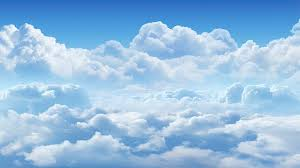

In [16]:
display(img)

**We can see that the prediction was correct**